<a href="https://colab.research.google.com/github/AlbertoMartinezS/idal_ia3/blob/main/PROYECTOBBAYOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
COLAB = True

In [2]:
"""
if COLAB:
    !pip install h5py==2.10.0
    !pip install googledrivedownloader

"""

'\nif COLAB:\n    !pip install h5py==2.10.0\n    !pip install googledrivedownloader\n\n'

In [3]:
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from keras.models import Sequential, load_model, Model
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense, GlobalAveragePooling2D
from keras import backend as K
from keras.callbacks import ModelCheckpoint
from keras import regularizers
from keras import optimizers
from keras import models
from glob import glob
import cv2

import matplotlib.pyplot as plt
import numpy as np

from IPython.display import SVG, display, clear_output
from keras.utils.vis_utils import model_to_dot

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

%matplotlib inline

In [4]:
!ls

sample_data


In [5]:
"""
!unzip test.zip
!unzip train.zip
!unzip val.zip
"""

'\n!unzip test.zip\n!unzip train.zip\n!unzip val.zip\n'

In [6]:
if COLAB:
    from google.colab import drive
    drive.mount('/content/drive')


Mounted at /content/drive


In [7]:
if COLAB:
  path= 'drive/MyDrive/Datasets/ProyectoBA/test.zip'
  !cp $path .
  !unzip -q test.zip
  path= 'drive/MyDrive/Datasets/ProyectoBA/train.zip'
  !cp $path .
  !unzip -q train.zip
  path= 'drive/MyDrive/Datasets/ProyectoBA/val.zip'
  !cp $path .
  !unzip -q val.zip

In [8]:
!ls

drive  sample_data  test  test.zip  train  train.zip  val  val.zip


In [9]:
!ls train

bio  obj


In [10]:
!ls val

bio  obj


In [11]:
!ls train/bio

bio0000_frame0000001.jpg  bio0002_frame0000564.jpg  bio0014_frame0000137.jpg
bio0000_frame0000002.jpg  bio0002_frame0000567.jpg  bio0014_frame0000143.jpg
bio0000_frame0000004.jpg  bio0002_frame0000570.jpg  bio0014_frame0000148.jpg
bio0000_frame0000006.jpg  bio0002_frame0000576.jpg  bio0014_frame0000158.jpg
bio0000_frame0000008.jpg  bio0002_frame0000579.jpg  bio0014_frame0000163.jpg
bio0000_frame0000010.jpg  bio0002_frame0000582.jpg  bio0014_frame0000168.jpg
bio0000_frame0000012.jpg  bio0002_frame0000585.jpg  bio0014_frame0000173.jpg
bio0000_frame0000014.jpg  bio0002_frame0000588.jpg  bio0014_frame0000178.jpg
bio0000_frame0000017.jpg  bio0002_frame0000591.jpg  bio0014_frame0000183.jpg
bio0000_frame0000019.jpg  bio0002_frame0000594.jpg  bio0014_frame0000188.jpg
bio0000_frame0000021.jpg  bio0002_frame0000597.jpg  bio0014_frame0000193.jpg
bio0000_frame0000023.jpg  bio0002_frame0000600.jpg  bio0014_frame0000199.jpg
bio0000_frame0000025.jpg  bio0002_frame0000603.jpg  bio0014_frame0000206.jpg

In [12]:
ficheros = glob("./train/obj/*")
ficheros[0]

'./train/obj/obj0865_frame0000041.jpg'

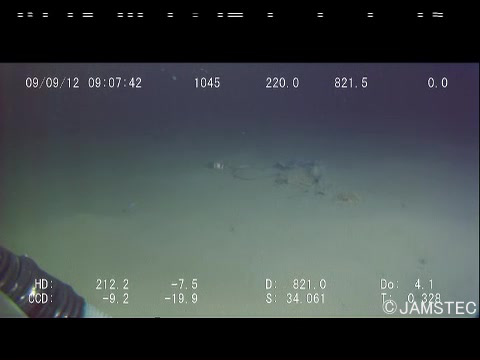

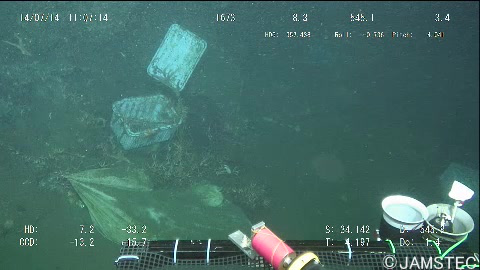

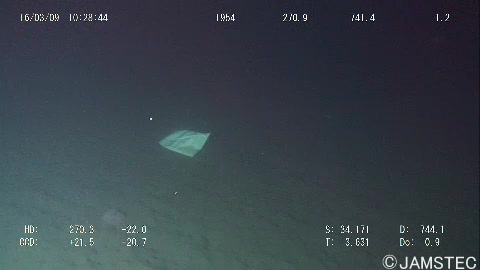

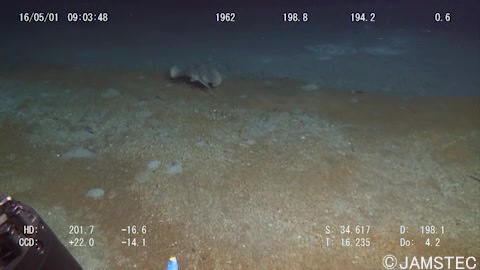

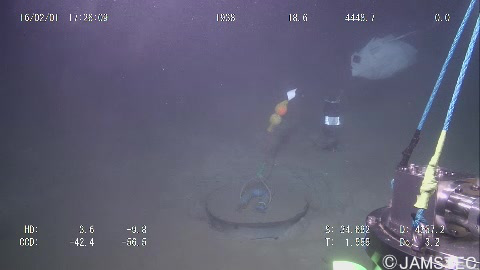

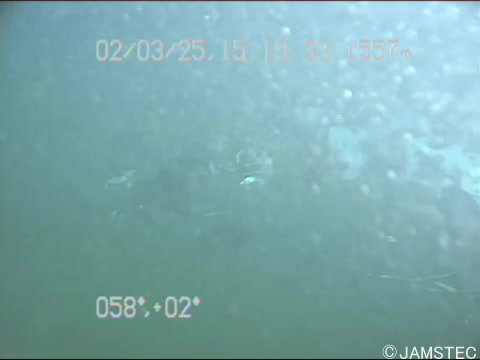

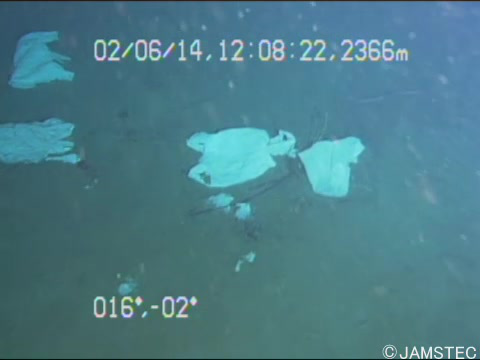

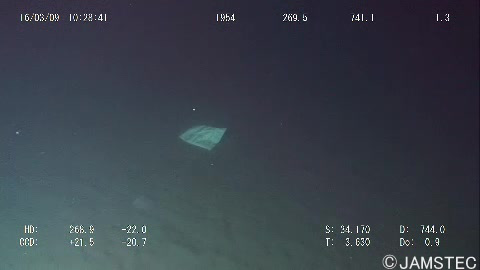

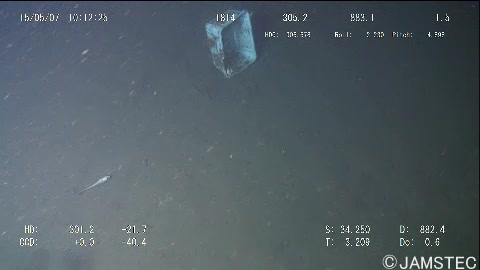

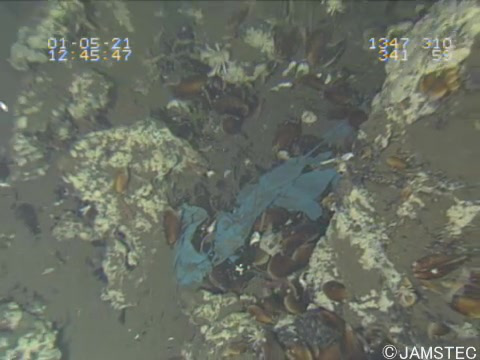

In [13]:
for fich in ficheros[10:20]:
    imagen = load_img(fich)
    display(imagen)
    print()

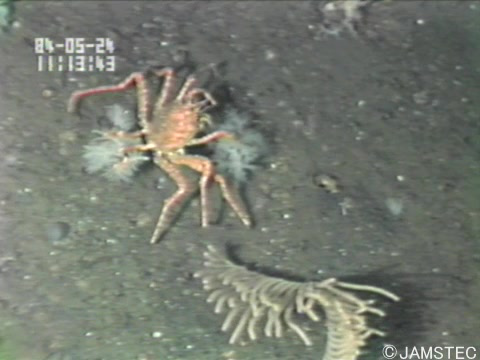

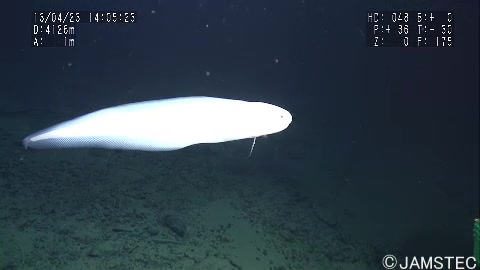

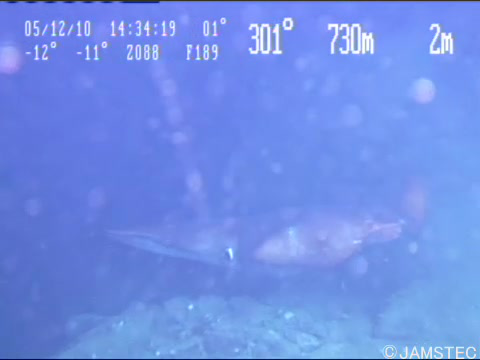

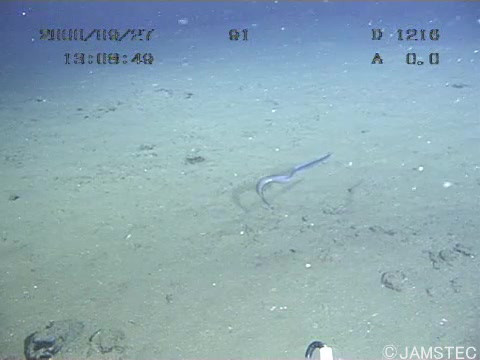

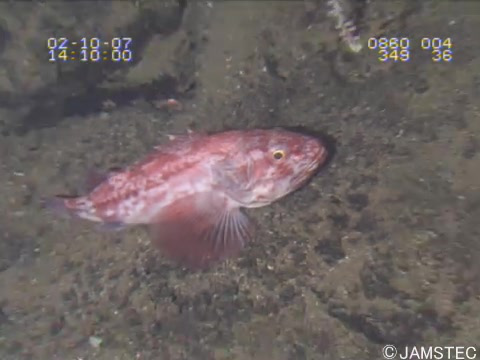

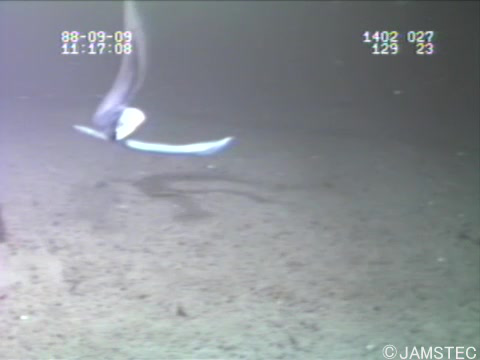

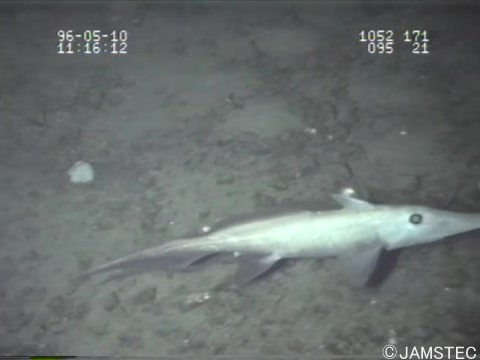

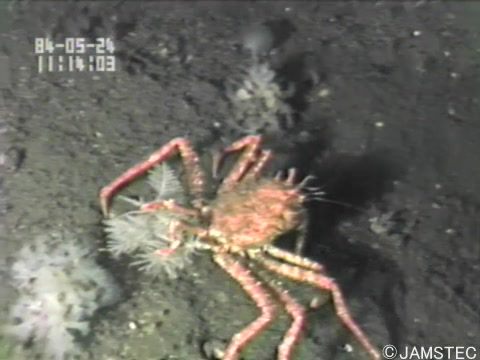

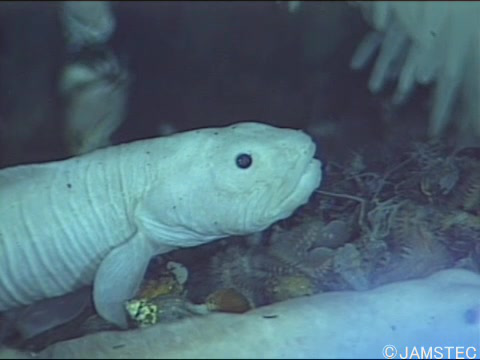

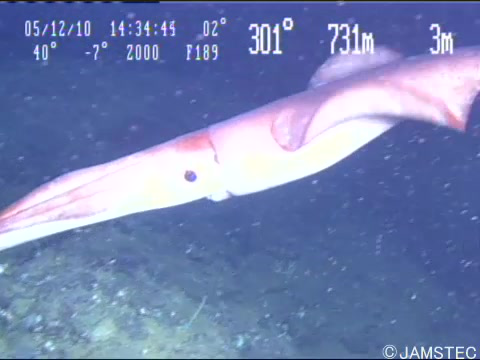

In [14]:
ficheros = glob("./train/bio/*")
for fich in ficheros[10:20]:
    imagen = load_img(fich)
    display(imagen)
    print()

In [15]:
train_data_dir = 'train'
validation_data_dir = 'val'
test_data_dir = 'test'

batch_size = 64

In [16]:
# Equivalente a:
# def preprocess_input(x):
#     return x/255.

preprocess_input = lambda x:x/255.

In [17]:
# data augmentation:

train_datagen = ImageDataGenerator(
    dtype='float32',
    preprocessing_function = preprocess_input,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    fill_mode='mirror',
    #fill_mode='nearest',
    #fill_mode='constant',
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True)

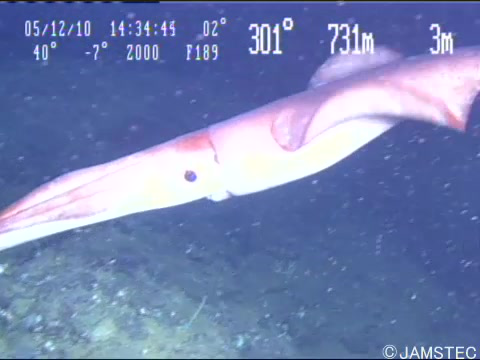

In [18]:
imagen

In [19]:
imagen_num = np.expand_dims(np.array(imagen), axis=0)

In [20]:
imagen_num.shape

(1, 360, 480, 3)

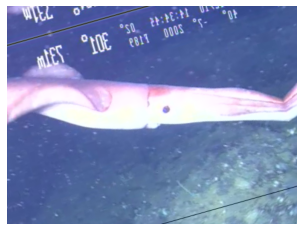

In [21]:
plt.imshow(train_datagen.flow(imagen_num)[0][0])
plt.axis("off");

## **Red convolucional**

In [22]:
# dimensiones a las que vamos a llevar las imágenes
img_width, img_height = 150, 150

normed_dims = (img_height, img_width)

In [23]:
normed_dims

(150, 150)

In [24]:
"""
model = Sequential()

model.add(Conv2D(32, (3,3), activation='relu', input_shape=normed_dims+(3,)))     
model.add(MaxPooling2D((2,2)))


model.add(Conv2D(32, (3,3), activation='relu', padding= 'same'))
model.add(MaxPooling2D((2,2)))

model.add(Conv2D(64, (3,3), activation='relu', padding= 'same'))
model.add(MaxPooling2D((2,2)))

model.add(Flatten())
model.add(Dense(32, activation='relu', kernel_regularizer="l2")) 
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))
model.compile(loss='categorical_crossentropy',
              optimizer="rmsprop",
              metrics=['accuracy'])

model.summary()
"""


'\nmodel = Sequential()\n\nmodel.add(Conv2D(32, (3,3), activation=\'relu\', input_shape=normed_dims+(3,)))     \nmodel.add(MaxPooling2D((2,2)))\n\n\nmodel.add(Conv2D(32, (3,3), activation=\'relu\', padding= \'same\'))\nmodel.add(MaxPooling2D((2,2)))\n\nmodel.add(Conv2D(64, (3,3), activation=\'relu\', padding= \'same\'))\nmodel.add(MaxPooling2D((2,2)))\n\nmodel.add(Flatten())\nmodel.add(Dense(32, activation=\'relu\', kernel_regularizer="l2")) \nmodel.add(Dropout(0.5))\nmodel.add(Dense(2, activation=\'softmax\'))\nmodel.compile(loss=\'categorical_crossentropy\',\n              optimizer="rmsprop",\n              metrics=[\'accuracy\'])\n\nmodel.summary()\n'

In [25]:


model = Sequential()

model.add(Conv2D(32, (5,5), activation='relu', input_shape=normed_dims+(3,), padding= 'same'))
model.add(Conv2D(32, (5,5), activation='relu', padding= 'same'))
                 
model.add(MaxPooling2D((2,2)))

model.add(Conv2D(32, (5,5), activation='relu', padding= 'same'))
model.add(Conv2D(32, (5,5), activation='relu', padding= 'same'))

model.add(MaxPooling2D((2,2)))

model.add(Conv2D(32, (5,5), activation='relu', padding= 'same'))
model.add(Conv2D(32, (5,5), activation='relu', padding= 'same'))

model.add(MaxPooling2D((2,2)))

model.add(Flatten())

model.add(Dense(256, activation='relu', kernel_regularizer="l2")) 
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu', kernel_regularizer="l2")) 
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))
model.compile(loss='categorical_crossentropy',
              #optimizer="rmsprop",
              optimizer= "adam",
              metrics=['accuracy'])

model.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 32)      2432      
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 32)      25632     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 32)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 75, 75, 32)        25632     
                                                                 
 conv2d_3 (Conv2D)           (None, 75, 75, 32)        25632     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 37, 37, 32)       0         
 2D)                                                    

In [26]:
train_datagen = ImageDataGenerator(
    dtype='float32',
    preprocessing_function = preprocess_input,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    fill_mode='mirror',
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

val_datagen  = ImageDataGenerator(dtype='float32',
                                  preprocessing_function = preprocess_input)

test_datagen = ImageDataGenerator(dtype='float32',
                                  preprocessing_function = preprocess_input)

In [27]:
validation_data_dir, normed_dims

('val', (150, 150))

In [28]:
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=True,
    class_mode='categorical') # binary, categorical, sparse

validation_generator = val_datagen.flow_from_directory(
    validation_data_dir,
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    class_mode='categorical') # binary, categorical, sparse

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    class_mode='categorical') # binary, categorical, sparse

Found 5720 images belonging to 2 classes.
Found 1640 images belonging to 2 classes.
Found 1144 images belonging to 2 classes.


In [29]:
train_generator.class_indices

{'bio': 0, 'obj': 1}

In [30]:
number_train_samples = train_generator.n
number_val_samples   = validation_generator.n
number_test_samples  = test_generator.n

number_train_samples, number_val_samples, number_test_samples

(5720, 1640, 1144)

In [31]:
from matplotlib.ticker import MaxNLocator

def grafica_entrenamiento(tr_acc, val_acc, tr_loss, val_loss, best_i,
                          figsize=(10,4)):
    plt.figure(figsize=figsize)
    ax = plt.subplot(1,2,1)
    plt.plot(1+np.arange(len(tr_acc)),  100*np.array(tr_acc))
    plt.plot(1+np.arange(len(val_acc)), 100*np.array(val_acc))
    plt.plot(1+best_i, 100*val_acc[best_i], 'or')
    plt.title('tasa de acierto del modelo (%)', fontsize=18)
    plt.ylabel('tasa de acierto (%)', fontsize=18)
    plt.xlabel('época', fontsize=18)
    plt.legend(['entrenamiento', 'validación'], loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    plt.subplot(1,2,2)
    plt.plot(1+np.arange(len(tr_acc)), np.array(tr_loss))
    plt.plot(1+np.arange(len(val_acc)), np.array(val_loss))
    plt.plot(1+best_i, val_loss[best_i], 'or')
    plt.title('loss del modelo', fontsize=18)
    plt.ylabel('loss', fontsize=18)
    plt.xlabel('época', fontsize=18)
    plt.legend(['entrenamiento', 'validación'], loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

In [32]:
acum_tr_acc = []
acum_val_acc = []
best_val_acc = -1000
acum_tr_loss  = []
acum_val_loss = []

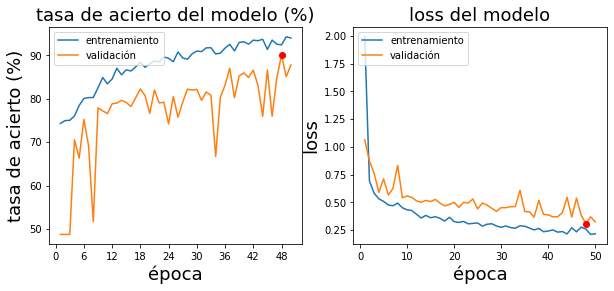

In [33]:
epochs = 50

modelpath="model_current_best_parte3.h5"

checkpoint = ModelCheckpoint(modelpath, monitor='val_accuracy', verbose=1,
                             save_best_only=True,
                             mode='max') # graba sólo los que mejoran en validación
callbacks_list = [checkpoint]
for e in range(epochs):
    history = model.fit(train_generator, 
                        steps_per_epoch=number_train_samples // batch_size,
                        epochs=1,
                        callbacks=callbacks_list,
                        verbose=1,
                        shuffle = False,
                        validation_data=validation_generator,
                        validation_steps=number_val_samples // batch_size
                       )
    
    if history.history['val_accuracy'][-1] > best_val_acc:
        print("Validation accuracy improved from",
            best_val_acc, 'to', history.history['val_accuracy'])
        print("saving weights")
        best_val_acc = history.history['val_accuracy'][-1]
    
    acum_tr_acc.append(history.history['accuracy'][0])
    acum_val_acc.append(history.history['val_accuracy'][0])
    acum_tr_loss.append(history.history['loss'][0])
    acum_val_loss.append(history.history['val_loss'][0])
    
    if len(acum_tr_acc) > 1:
        clear_output()
        best_i = np.argmax(acum_val_acc)
        grafica_entrenamiento(acum_tr_acc, acum_val_acc, acum_tr_loss, acum_val_loss, best_i)

In [34]:
model = load_model(modelpath)

## **Resultados obtenidos**

In [35]:
scores_tr = model.evaluate(train_generator)
print('Train loss    :', scores_tr[0])
print('Train accuracy:', scores_tr[1])
print()

scores_val = model.evaluate(validation_generator)
print('Val loss    :', scores_val[0])
print('Val accuracy:', scores_val[1])
print()

scores_te = model.evaluate(test_generator)
print('Test loss     :', scores_te[0])
print('Test accuracy :', scores_te[1])

90/90 [==============================] - 48s 526ms/step - loss: 0.1955 - accuracy: 0.9490
Train loss    : 0.1955309957265854
Train accuracy: 0.9489510655403137

26/26 [==============================] - 7s 247ms/step - loss: 0.3037 - accuracy: 0.9018
Val loss    : 0.3037218749523163
Val accuracy: 0.9018292427062988

18/18 [==============================] - 5s 290ms/step - loss: 0.1539 - accuracy: 0.9677
Test loss     : 0.15390287339687347
Test accuracy : 0.9676573276519775


In [36]:
y_real = test_generator.classes
y_pred_proba = model.predict(test_generator)
y_pred = np.argmax(y_pred_proba, axis=1)
print('')
print(classification_report(y_real, y_pred))


              precision    recall  f1-score   support

           0       0.95      0.91      0.93       272
           1       0.97      0.99      0.98       872

    accuracy                           0.97      1144
   macro avg       0.96      0.95      0.95      1144
weighted avg       0.97      0.97      0.97      1144



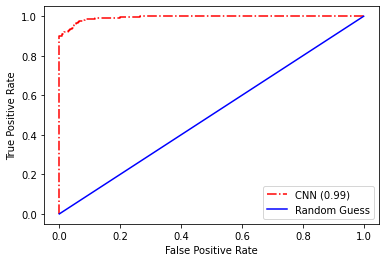

In [37]:
clase_positiva = 1
fpr, tpr, thresholds = roc_curve(y_real==clase_positiva, y_pred_proba[:,clase_positiva])
fig, ax1 = plt.subplots(1,1)
ax1.plot(fpr, tpr, 'r-.', label = 'CNN (%2.2f)' % auc(fpr, tpr))
ax1.set_xlabel('False Positive Rate')
ax1.set_ylabel('True Positive Rate')
ax1.plot(fpr, fpr, 'b-', label = 'Random Guess')
ax1.legend();

## **Visualización de ejemplos de test**

In [38]:
test_datagen2 = ImageDataGenerator(dtype='float32',
                                   preprocessing_function = preprocess_input)

test_generator2 = test_datagen2.flow_from_directory(
    test_data_dir,
    target_size=normed_dims,
    batch_size=test_generator.n, # todas las imágenes del directorio test
    shuffle=False,
    class_mode='categorical')

Found 1144 images belonging to 2 classes.


In [39]:
test_generator2.reset()
X_te, y_te = test_generator2.next()

In [40]:
X_te.shape

(1144, 150, 150, 3)

In [41]:
X_te.max()

1.0

In [42]:
class_indices = test_generator2.class_indices
class_indices

{'bio': 0, 'obj': 1}

Probabilidad bio: 19.9%
Probabilidad obj : 80.1%


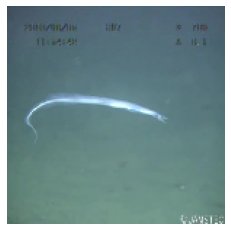

In [43]:
ind_te1 = 150

image = X_te[ind_te1].copy()

plt.imshow(image, cmap='jet')
plt.axis("off")
p = model.predict(np.expand_dims(image, axis=0))[0][class_indices["bio"]]
print("Probabilidad bio: {:2.1f}%".format(100*p))
p = model.predict(np.expand_dims(image, axis=0))[0][class_indices["obj"]]
print("Probabilidad obj : {:2.1f}%".format(100*p))

## **Visualización del funcionamiento de la red**

In [44]:
weights = model.get_weights()
print(np.shape(weights))
for i in range(len(weights)):
    print('shape of weights[%d]: ' % i, np.shape(weights[i]))

(18,)
shape of weights[0]:  (5, 5, 3, 32)
shape of weights[1]:  (32,)
shape of weights[2]:  (5, 5, 32, 32)
shape of weights[3]:  (32,)
shape of weights[4]:  (5, 5, 32, 32)
shape of weights[5]:  (32,)
shape of weights[6]:  (5, 5, 32, 32)
shape of weights[7]:  (32,)
shape of weights[8]:  (5, 5, 32, 32)
shape of weights[9]:  (32,)
shape of weights[10]:  (5, 5, 32, 32)
shape of weights[11]:  (32,)
shape of weights[12]:  (10368, 256)
shape of weights[13]:  (256,)
shape of weights[14]:  (256, 128)
shape of weights[15]:  (128,)
shape of weights[16]:  (128, 2)
shape of weights[17]:  (2,)


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


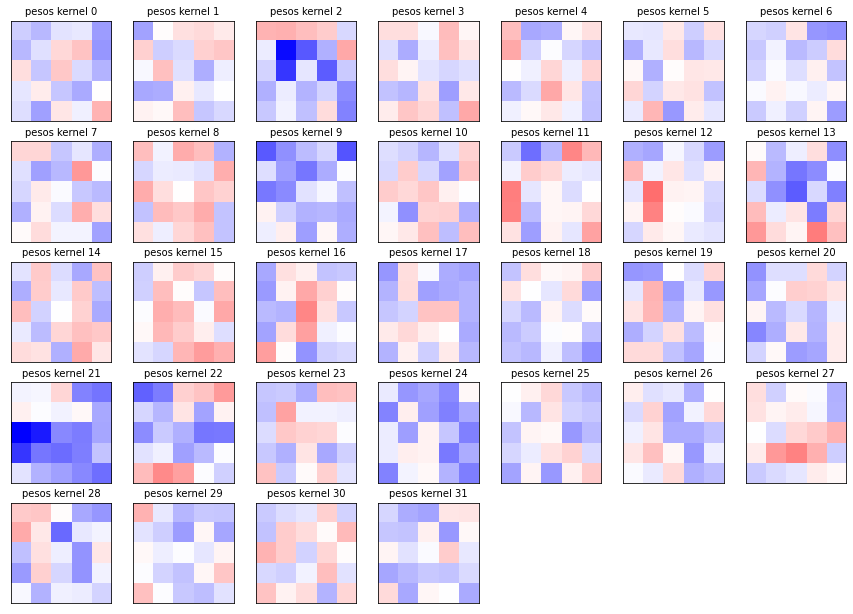

In [45]:
# kernels de la primera capa convolucional
ncapa = 0

nfilters = weights[ncapa].shape[3]
ncols = 7 # número de columnas en la figura


ma = abs(weights[ncapa]).max()
nrows = int(np.ceil(nfilters/ncols)) # número de filas en la figura
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15*nrows/ncols))
axes_r = axes.ravel()
for i in range(nfilters):
    kernel = weights[ncapa][:,:,2,i]
    ax = axes_r[i]
    ax.imshow(kernel, vmin=-ma, vmax=ma, cmap='bwr')
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_title('pesos kernel %d' % i, fontsize=10)
for i in range(nfilters,nrows*ncols):
    fig.delaxes(axes_r[i])

### **Visualización de las salidas de una sola capa**

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_input (InputLayer)   [(None, 150, 150, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 150, 150, 32)      2432      
                                                                 
Total params: 2,432
Trainable params: 2,432
Non-trainable params: 0
_________________________________________________________________





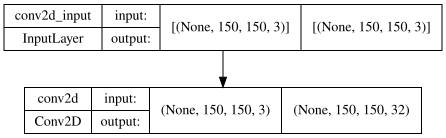

In [46]:
# salida de una sola capa
ncapa = 0
intermediate_layer_model = Model(inputs=model.input,
                                 outputs=model.layers[ncapa].output)
intermediate_layer_model.summary()
print("\n\n")
if COLAB:
    display(SVG(model_to_dot(intermediate_layer_model,show_shapes=True,dpi=72).create(prog='dot', format='svg')))
else:
    display(SVG(model_to_dot(intermediate_layer_model,show_shapes=True).create(prog='dot', format='svg')))

In [47]:
imagen = X_te[1005]
imagen.shape

(150, 150, 3)

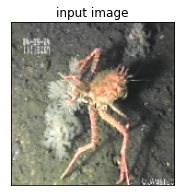

Salidas capa conv2d (1, 150, 150, 32)


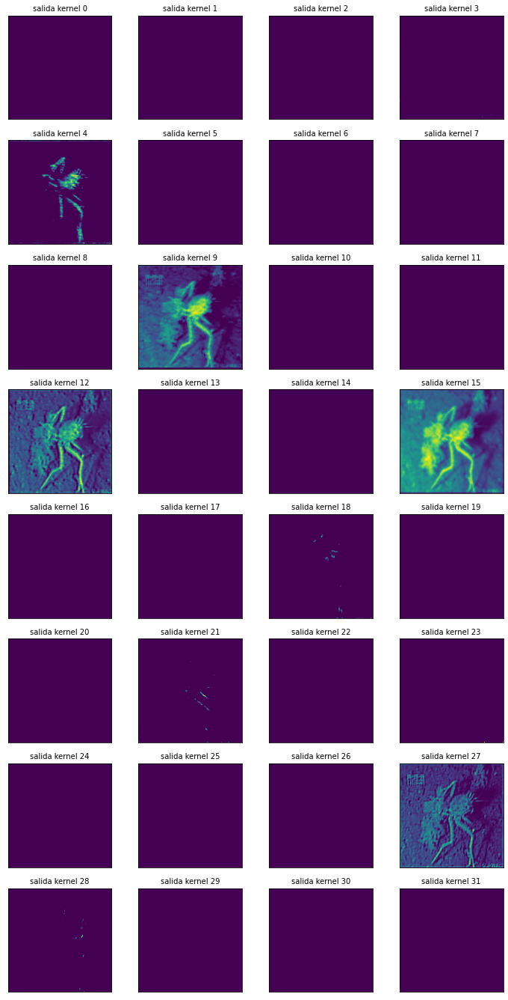

In [48]:
ejemplo = 10

imagen = X_te[ejemplo]
aux = np.expand_dims(imagen, axis=0)
salida_capa = intermediate_layer_model.predict(aux)

plt.figure(figsize=(3,3))
plt.imshow(imagen, cmap='gray')
plt.title('input image', size=12)
plt.xticks(())
plt.yticks(())
plt.show()

print("Salidas capa "+intermediate_layer_model.layers[-1].name, salida_capa.shape)

nsalidas = salida_capa.shape[-1]
ncols = 4
nrows = int(np.ceil(nsalidas / ncols))

ma = abs(salida_capa).max()

plt.subplots(nrows,ncols,figsize = (12, 3*nrows))

for i in range(nsalidas):
    plt.subplot(nrows,ncols,i+1)
#    plt.imshow(salida_capa[0,:,:,i], vmin=-ma, vmax=ma, cmap='bwr')
    plt.imshow(salida_capa[0,:,:,i], cmap='viridis')
    plt.xticks(())
    plt.yticks(())
    plt.title('salida kernel %d' % i, fontsize=10)

### **Visualización de las salidas de varias capas**

In [49]:
# Now we extract the outputs of the top 6 layers:
layer_outputs = [layer.output for layer in model.layers[:6]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(X_te[ejemplo:(ejemplo+1)])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide


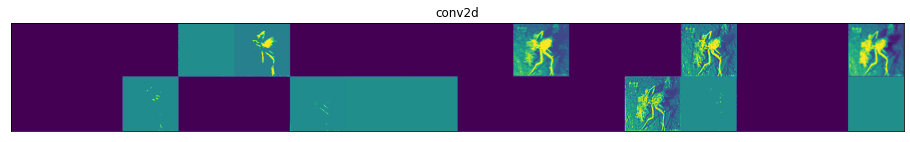

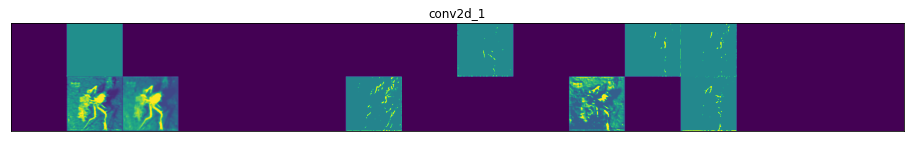

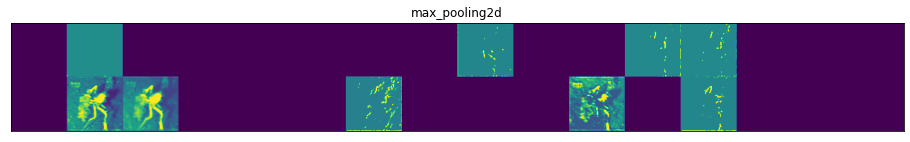

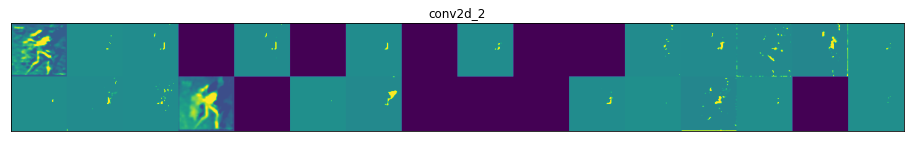

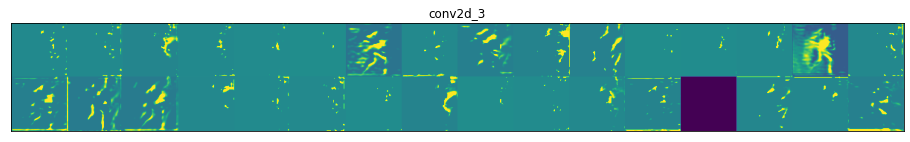

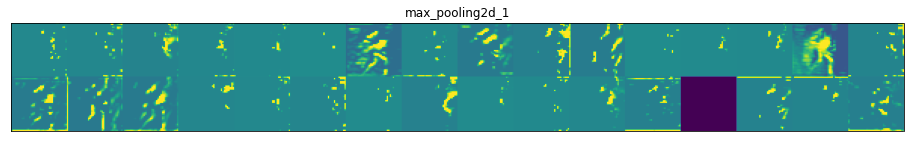

In [50]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

In [51]:
import tensorflow as tf

def find_ind_last_conv2D(model):
    ind_last_conv2D_layer = None
    for i,x in enumerate(model.layers):
        if x.__class__.__name__ == "Conv2D":
            ind_last_conv2D_layer = i
    return ind_last_conv2D_layer


def show_heatmap(model, im):
    imag = np.expand_dims(im, axis=0) # de 1 imagen pasamos a 1 conjunto de 1 imagen
        
    # The is the output feature map of the last convolutional layer
    last_conv_layer = model.layers[find_ind_last_conv2D(model)]
    
    # This is the gradient of the "benign" class with regard to
    # the output feature map of last convolutional layer
    with tf.GradientTape() as tape:
        aux = model.output
        #aux = model.layers[-2].output # salida de la última capa densa antes de softmax

        iterate = tf.keras.models.Model([model.inputs], [aux, last_conv_layer.output])
        model_out, last_conv_layer = iterate(imag)
        class_out = model_out[:, np.argmax(model_out[0])]
        grads = tape.gradient(class_out, last_conv_layer)

        # mean intensity of the gradient over a specific feature map channel:
        pooled_grads = K.mean(grads, axis=(0, 1, 2))
    
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)    
    heatmap = np.maximum(heatmap, 0) # se quitan los negativos (se ponen a 0)
    heatmap /= np.max(heatmap) # se normaliza entre 0 y 1
    heatmap = heatmap[0] # pasamos de 1 conjunto de 1 heatmap a 1 heatmap
    
    # We use cv2 to load the original image
    #img = cv2.imread(img_path)
    img = imag[0]
    
    img = np.zeros((im.shape[0],im.shape[1],3))
#    print(im.shape, imag.shape)
    for i in range(3):
        img[:,:,i] = imag[0,:,:,0]

    
    # We resize the heatmap to have the same size as the original image
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    
    # We convert the heatmap to RGB
    heatmap = np.uint8(255 * heatmap)
    
    # We apply the heatmap to the original image
    #heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET) / 255
    #heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_BONE) / 255
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_HOT) / 255
    
    
    # 0.4 here is a heatmap intensity factor
    superimposed_img = heatmap * 0.5 + 0.5*im
    #print(heatmap.min(), heatmap.max(), heatmap.mean(), heatmap.std())
    #print(img.min(), img.max(), img.mean(), img.std())
    #print(superimposed_img.min(),  superimposed_img.max(),
    #      superimposed_img.mean(), superimposed_img.std())
    
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(im, vmin=0, vmax=1); plt.xticks([]); plt.yticks([])
    plt.subplot(1,3,2)
    plt.imshow(heatmap, vmin=0, vmax=1); plt.xticks([]); plt.yticks([])
    plt.subplot(1,3,3)
    plt.imshow(superimposed_img, vmin=0, vmax=1); plt.xticks([]); plt.yticks([])
    plt.show()
    #print(np.shape(imag))
    prob = 100*model.predict(imag)[0][class_indices["obj"]]
    print("Probabilidad clase obj : {:2.1f}%".format(prob))
    prob = 100*model.predict(imag)[0][class_indices["bio"]]
    print("Probabilidad clase bio: {:2.1f}%".format(prob))
    print("\n\n")
    return heatmap, superimposed_img

**Visualización de mapas de sensibilidades (heatmaps) en varios ejemplos:**

In [52]:
X_te[i].max()

1.0

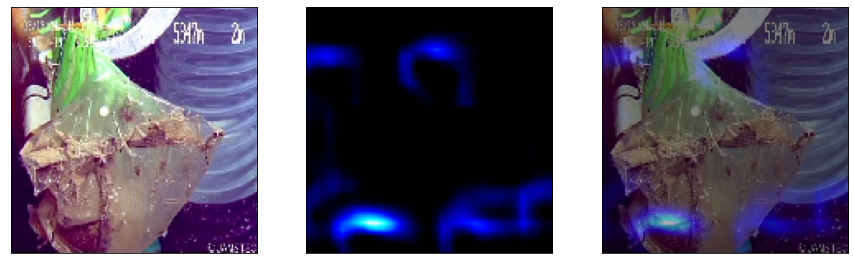

Probabilidad clase obj : 100.0%
Probabilidad clase bio: 0.0%





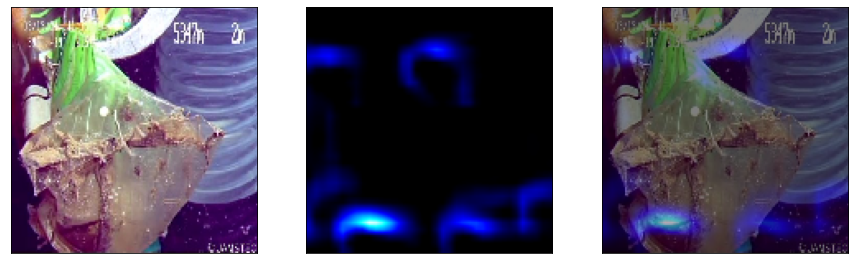

Probabilidad clase obj : 100.0%
Probabilidad clase bio: 0.0%





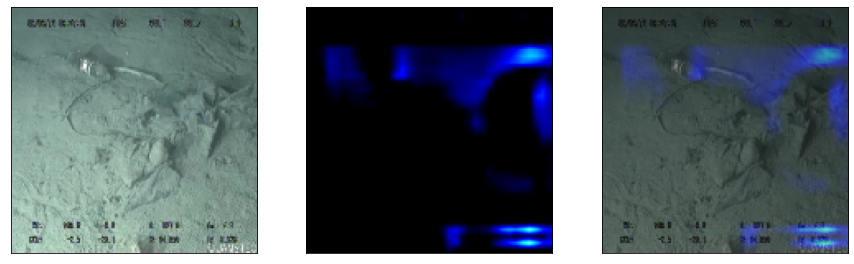

Probabilidad clase obj : 56.1%
Probabilidad clase bio: 43.9%





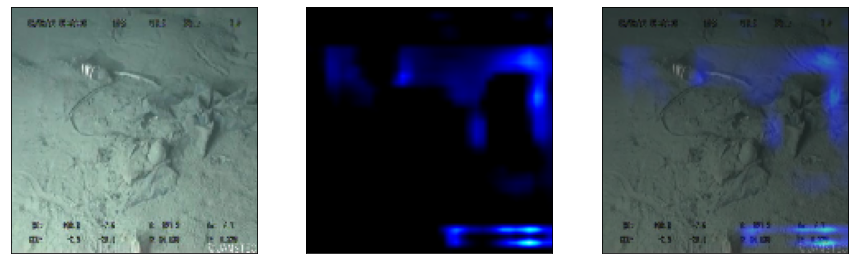

Probabilidad clase obj : 76.4%
Probabilidad clase bio: 23.6%





/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


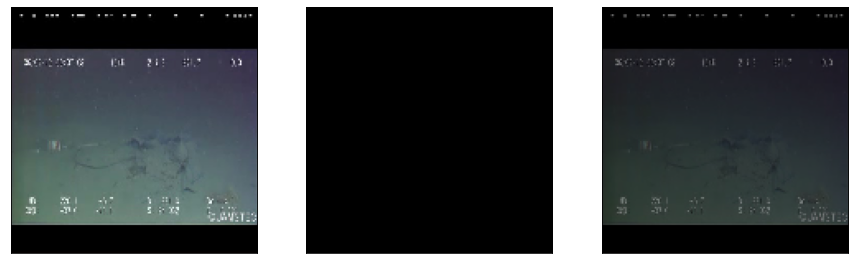

Probabilidad clase obj : 100.0%
Probabilidad clase bio: 0.0%





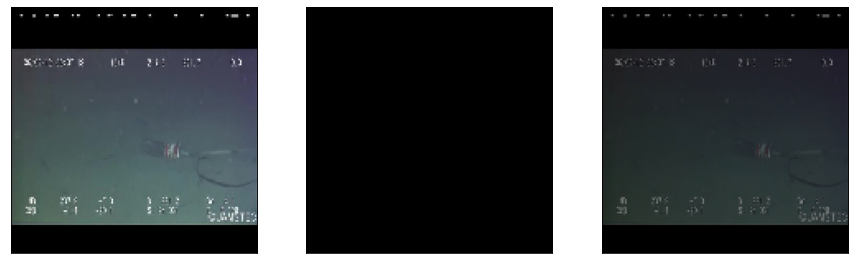

Probabilidad clase obj : 100.0%
Probabilidad clase bio: 0.0%





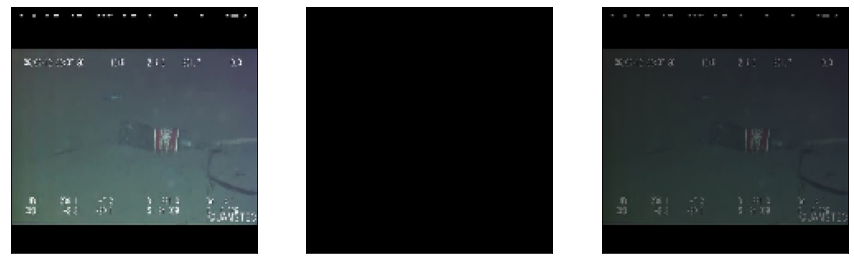

Probabilidad clase obj : 100.0%
Probabilidad clase bio: 0.0%





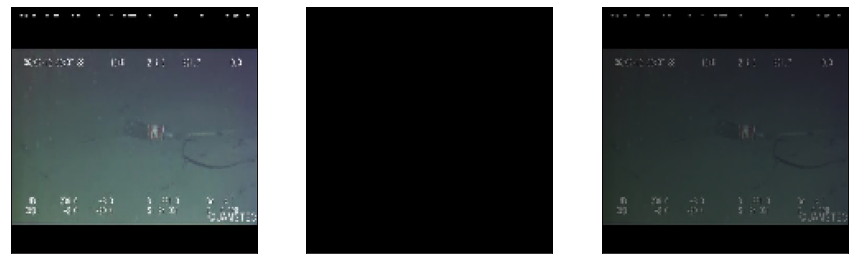

Probabilidad clase obj : 100.0%
Probabilidad clase bio: 0.0%





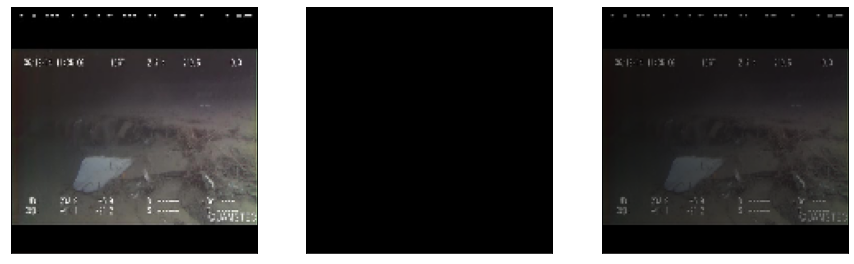

Probabilidad clase obj : 100.0%
Probabilidad clase bio: 0.0%





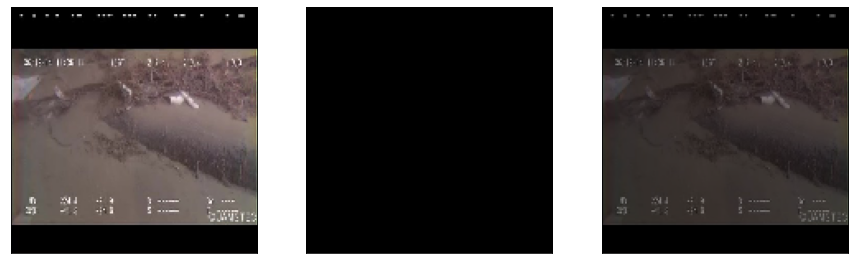

Probabilidad clase obj : 100.0%
Probabilidad clase bio: 0.0%





In [75]:
ind = 700 # visualizamos 10 ejemplos de test a partir de este (en test hay 2002 ejemplos)
#ind = 200

for i in range(ind, ind+10):
    show_heatmap(model, X_te[i])

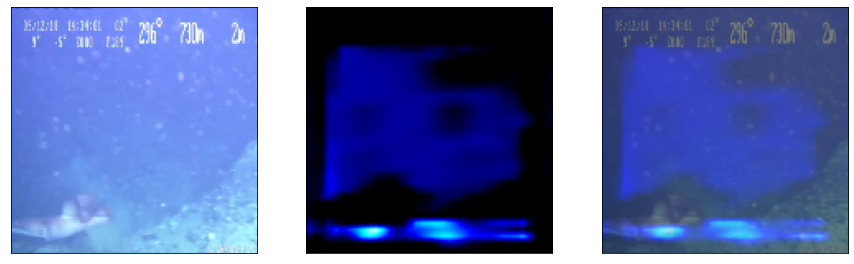

Probabilidad clase obj : 96.4%
Probabilidad clase bio: 3.6%





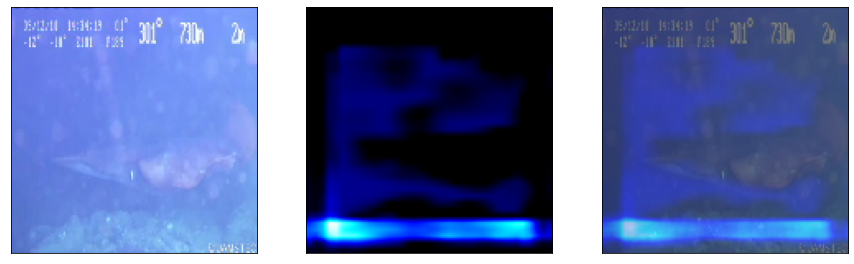

Probabilidad clase obj : 96.4%
Probabilidad clase bio: 3.6%





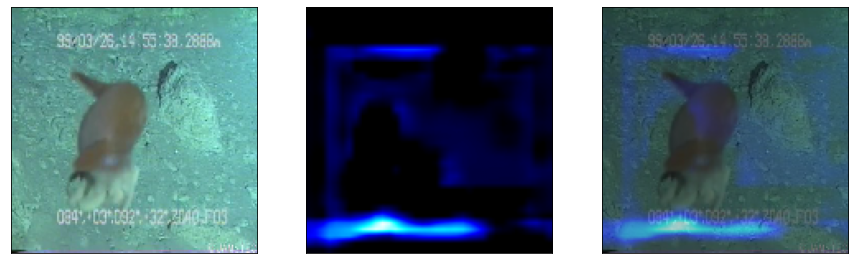

Probabilidad clase obj : 96.0%
Probabilidad clase bio: 4.0%





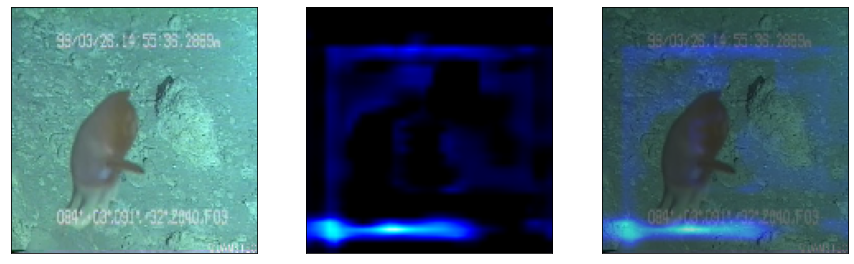

Probabilidad clase obj : 95.8%
Probabilidad clase bio: 4.2%





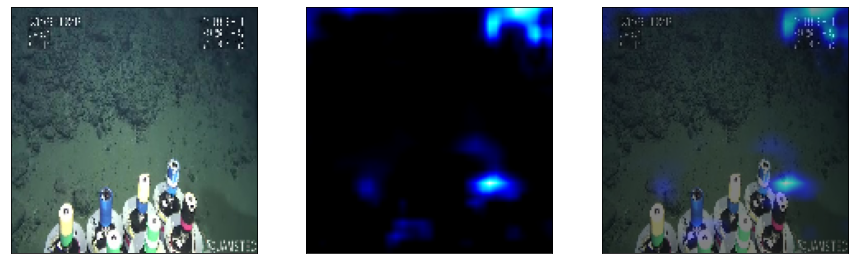

Probabilidad clase obj : 95.3%
Probabilidad clase bio: 4.7%





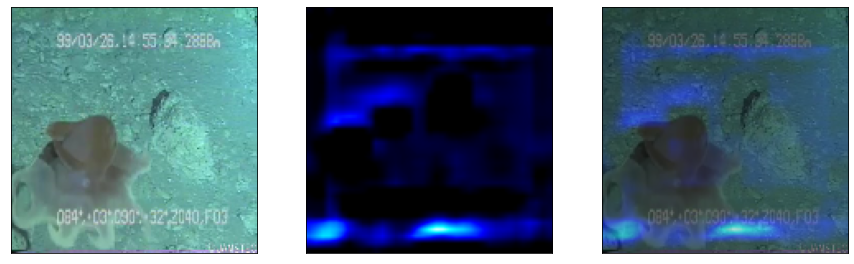

Probabilidad clase obj : 94.9%
Probabilidad clase bio: 5.1%





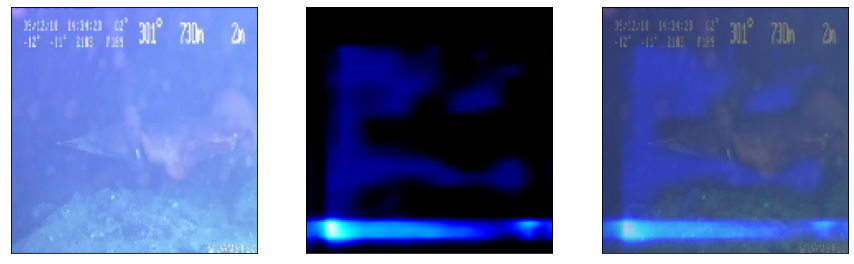

Probabilidad clase obj : 94.6%
Probabilidad clase bio: 5.4%





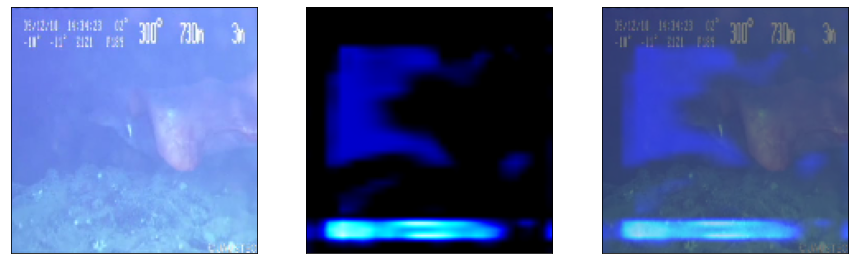

Probabilidad clase obj : 94.3%
Probabilidad clase bio: 5.7%





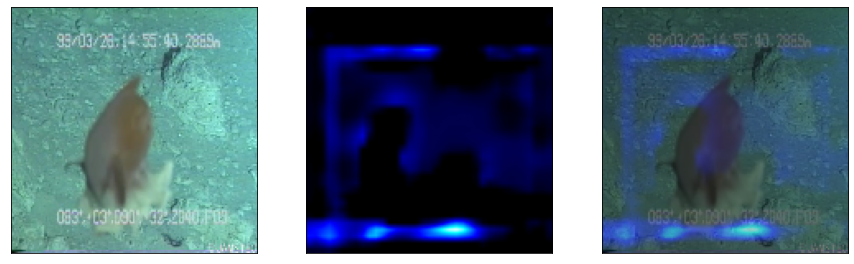

Probabilidad clase obj : 93.9%
Probabilidad clase bio: 6.1%





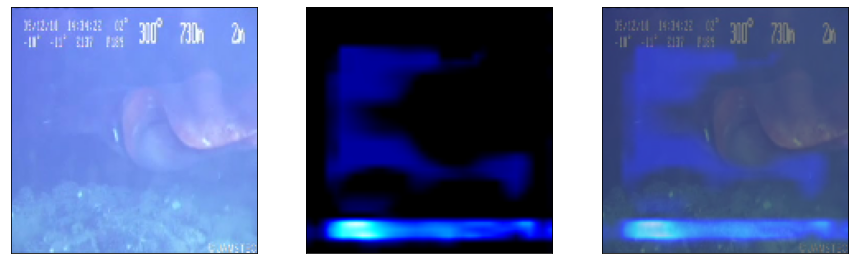

Probabilidad clase obj : 92.7%
Probabilidad clase bio: 7.3%





In [76]:
inds = np.where(y_te[:,class_indices["bio"]]==1)[0]
inds = sorted(inds, key=lambda i:y_pred_proba[i,class_indices["bio"]])
for i in inds[:10]:
    show_heatmap(model, X_te[i])

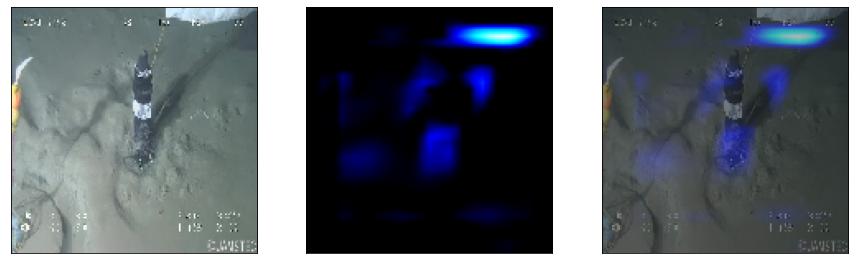

Probabilidad clase obj : 7.3%
Probabilidad clase bio: 92.7%





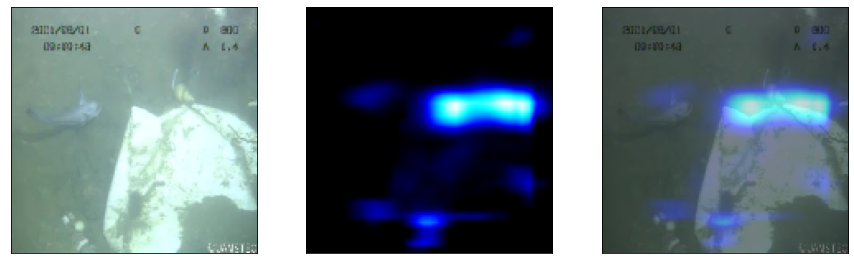

Probabilidad clase obj : 15.9%
Probabilidad clase bio: 84.1%





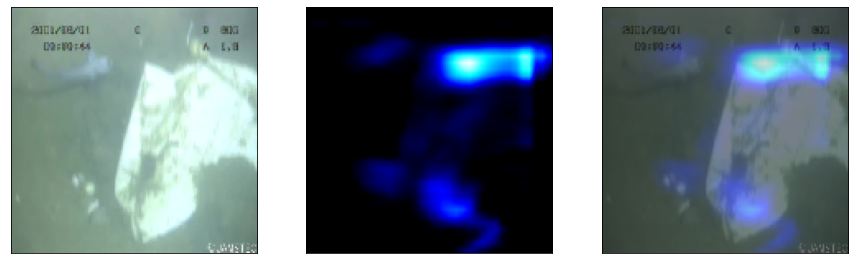

Probabilidad clase obj : 17.2%
Probabilidad clase bio: 82.8%





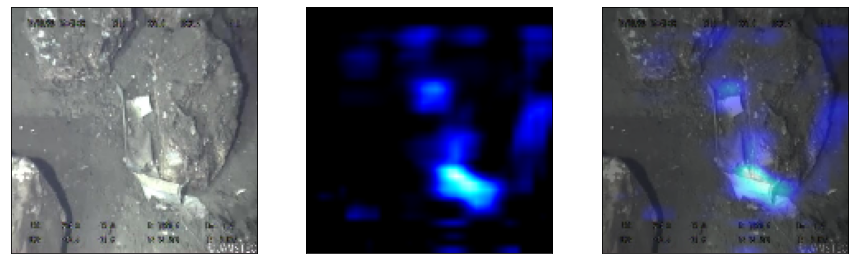

Probabilidad clase obj : 17.5%
Probabilidad clase bio: 82.5%





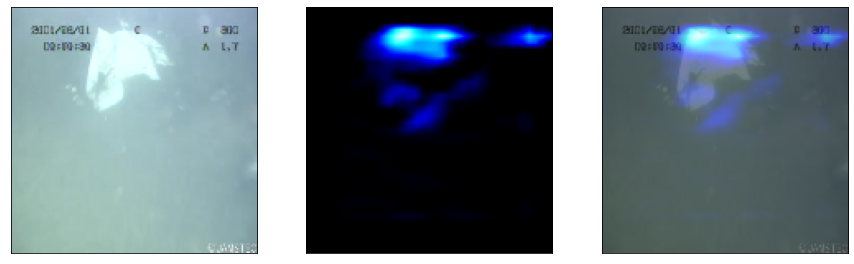

Probabilidad clase obj : 19.0%
Probabilidad clase bio: 81.0%





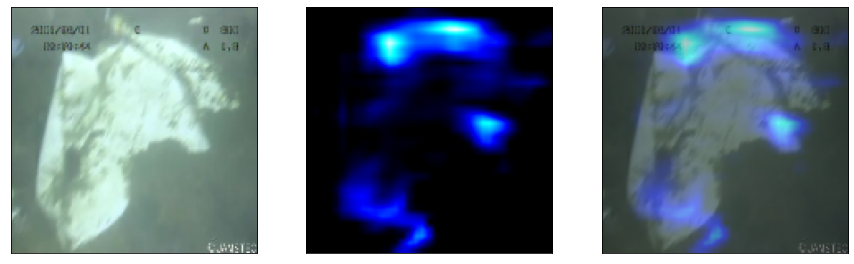

Probabilidad clase obj : 20.5%
Probabilidad clase bio: 79.5%





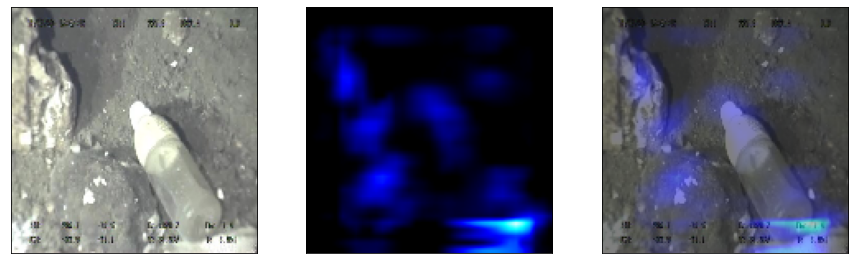

Probabilidad clase obj : 25.6%
Probabilidad clase bio: 74.4%





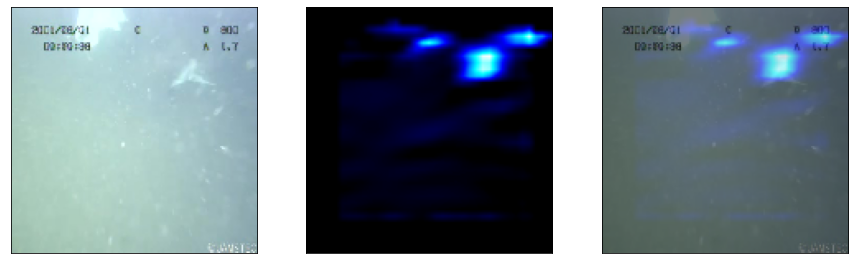

Probabilidad clase obj : 32.7%
Probabilidad clase bio: 67.3%





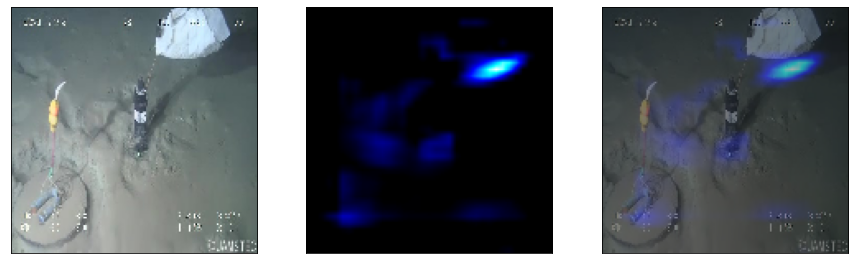

Probabilidad clase obj : 34.6%
Probabilidad clase bio: 65.4%





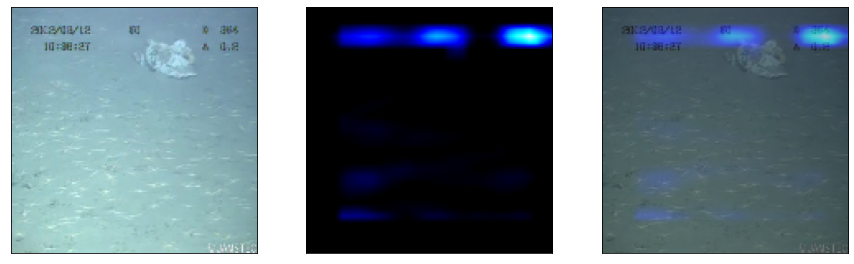

Probabilidad clase obj : 34.9%
Probabilidad clase bio: 65.1%





In [71]:
inds = np.where(y_te[:,class_indices["obj"]]==1)[0]
inds = sorted(inds, key=lambda i:y_pred_proba[i,class_indices["obj"]])
for i in inds[:10]:
    show_heatmap(model, X_te[i])

In [56]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 12481, done.
remote: Counting objects: 100% (35/35), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 12481 (delta 16), reused 16 (delta 4), pack-reused 12446
Receiving objects: 100% (12481/12481), 11.62 MiB | 13.30 MiB/s, done.
Resolving deltas: 100% (8676/8676), done.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [57]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 5.3 MB/s 
Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


In [58]:
#follow the link below to get your download code from from Roboflow
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")

     |████████████████████████████████| 145 kB 5.4 MB/s 
     |████████████████████████████████| 178 kB 9.6 MB/s 
     |████████████████████████████████| 1.1 MB 29.6 MB/s 
     |████████████████████████████████| 67 kB 5.7 MB/s 
     |████████████████████████████████| 54 kB 2.4 MB/s 
     |████████████████████████████████| 138 kB 46.2 MB/s 
     |████████████████████████████████| 63 kB 1.3 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=roboflow-yolov5


In [59]:
"""

#bbaprimero

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="dtPgVH4oVUJ8K0S6RZOF")
project = rf.workspace("beto_180196-hotmail-com").project("bba")
dataset = project.version(1).download("yolov5")
"""


'\n\n#bbaprimero\n\n!pip install roboflow\n\nfrom roboflow import Roboflow\nrf = Roboflow(api_key="dtPgVH4oVUJ8K0S6RZOF")\nproject = rf.workspace("beto_180196-hotmail-com").project("bba")\ndataset = project.version(1).download("yolov5")\n'

In [60]:
"""
#BLANCO Y NEGRO

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="dtPgVH4oVUJ8K0S6RZOF")
project = rf.workspace("beto_180196-hotmail-com").project("basurabajoagua")
dataset = project.version(1).download("yolov5")

"""

'\n#BLANCO Y NEGRO\n\n!pip install roboflow\n\nfrom roboflow import Roboflow\nrf = Roboflow(api_key="dtPgVH4oVUJ8K0S6RZOF")\nproject = rf.workspace("beto_180196-hotmail-com").project("basurabajoagua")\ndataset = project.version(1).download("yolov5")\n\n'

In [61]:

#NO BLANCO Y NEGRO

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="dtPgVH4oVUJ8K0S6RZOF")
project = rf.workspace("beto_180196-hotmail-com").project("basurabajoagua")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to basurabajoagua-2 in yolov5pytorch:: 100%|██████████| 2300/2300 [00:02<00:00, 814.36it/s] 


In [62]:
# train yolov5s on custom data for 100 epochs
# time its performance
#%%time
#%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/yolov5s.yaml --weights '' --name yolov5s_results  --cache

github: ⚠️ WARNING: code is out of date by 955 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/yolov5s.yaml', data='/content/yolov5/basurabajoagua-2/data.yaml', device='', entity=None, epochs=100, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tensorboard with "tensorb

In [63]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='/content/yolov5/basurabajoagua-2/test/images', update=False, view_img=False, weights=['runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 224 layers, 7064698 parameters, 0 gradients, 16.4 GFLOPS
image 1/114 /content/yolov5/basurabajoagua-2/test/images/bio0000_frame0000101_jpg.rf.e341aeccf000f0ba071aa64577b80db4.jpg: 416x416 2 1s, Done. (0.028s)
image 2/114 /content/yolov5

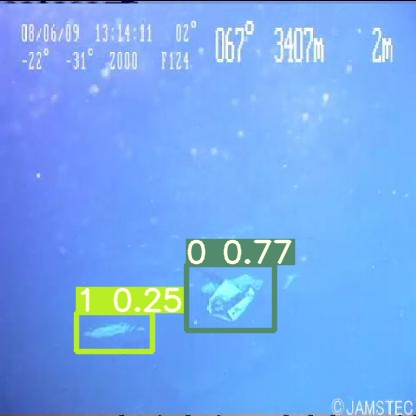

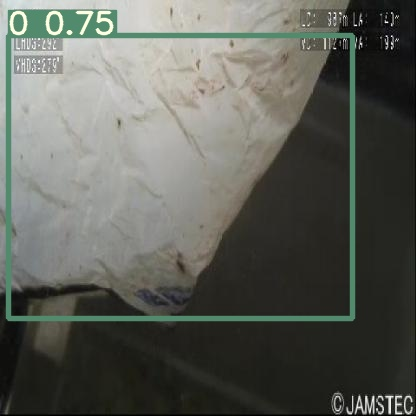

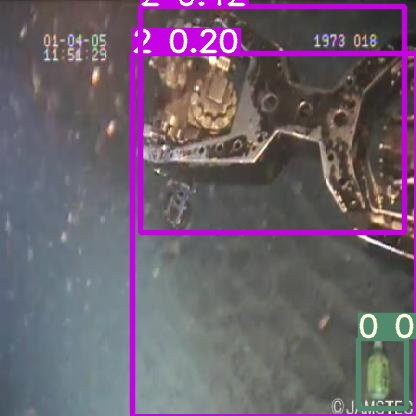

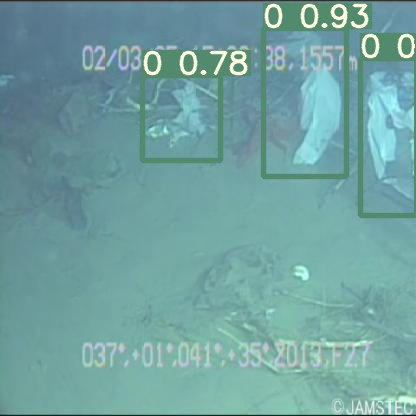

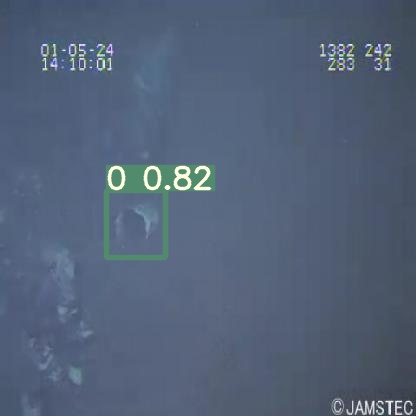

...

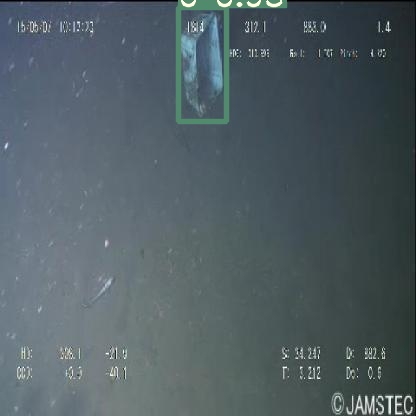

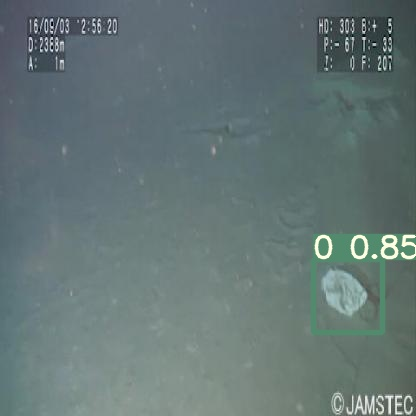

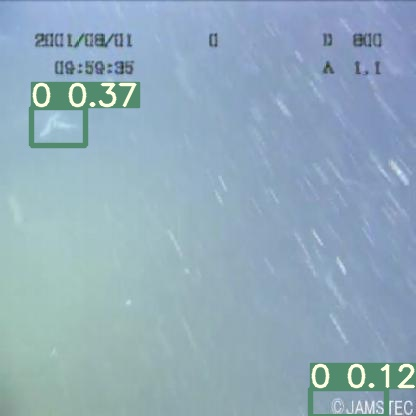

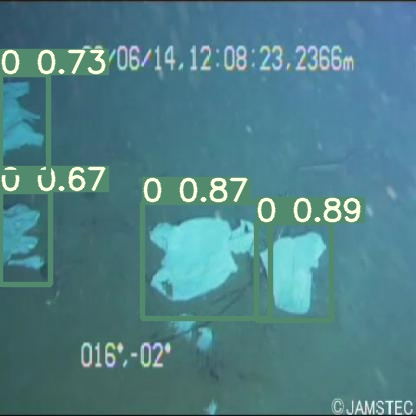

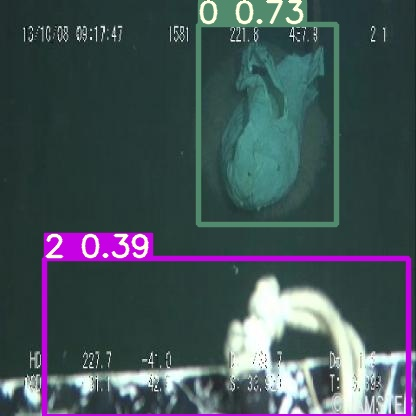

In [64]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [65]:
!ls


basurabajoagua-2  hubconf.py   README.md	 train.py
data		  LICENSE      requirements.txt  tutorial.ipynb
detect.py	  models       runs		 utils
Dockerfile	  __pycache__  test.py		 weights
